<h1 align="center">Final Project I</h1>


# Pendahuluan 
## Uber and Lyft Dataset Boston, MA
From 11-26-2018 to 12-18-2018

Dataset yang akan di olah kali ini adalah Uber and Lyft Dataset Boston, MA. Dataset mengandung banyak nilai NA. Ini adalah kumpulan data yang bagus untuk menggunakan Model Regresi Linier dan melihat pola antara predektor yang berbeda seperti jam dan harga.

Bagian yang menarik dari kumpulan data ini adalah data ini menyertakan data cuaca yang sesuai untuk jam tersebut dengan ringkasan singkat tentang cuaca. Faktor penting lainnya adalah suhu, angin, dan matahari terbenam. 

## Import Library yang dibutuhkan

In [1]:
# Impor pustaka-pustaka dasar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Impor fungsi-fungsi dari scikit-learn (sklearn)
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import make_scorer, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [2]:
#import file
df_can = pd.read_csv('rideshare_kaggle.csv')

In [3]:
#lima item pertama dalam dataset
df_can.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [4]:
df_can.columns

Index(['id', 'timestamp', 'hour', 'day', 'month', 'datetime', 'timezone',
       'source', 'destination', 'cab_type', 'product_id', 'name', 'price',
       'distance', 'surge_multiplier', 'latitude', 'longitude', 'temperature',
       'apparentTemperature', 'short_summary', 'long_summary',
       'precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'windGustTime', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime',
       'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon',
       'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex',
       'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase',
       'precipIntensityMax', 'uvIndexTime', 'temperatureMin',
       'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime',
       'apparentTemperatureMin', 'apparentTemperatureMinTime',
       'apparentTemperat

In [5]:
#5 item terakhir dalam datset
df_can.tail()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
693066,616d3611-1820-450a-9845-a9ff304a4842,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693067,633a3fc3-1f86-4b9e-9d48-2b7132112341,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693068,64d451d0-639f-47a4-9b7c-6fd92fbd264f,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693069,727e5f07-a96b-4ad1-a2c7-9abc3ad55b4e,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693070,e7fdc087-fe86-40a5-a3c3-3b2a8badcbda,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800


In [6]:
# Melihhat tipe data
df_can.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

In [7]:
# Melihat jumlah rows dan columns
print(df_can.shape)

(693071, 57)


## Data Cleaning

In [8]:
# Menjumlah kan missing values
missing_values = df_can.isnull().sum()

In [9]:
print(missing_values[missing_values > 0])

price    55095
dtype: int64


In [10]:
# Menghapus Null values
df_can.dropna(inplace=True)

In [11]:
df_can.shape

(637976, 57)

In [12]:
missing_values = df_can.isnull().sum()
print(missing_values[missing_values > 0])

Series([], dtype: int64)


In [13]:
unique_cab_types = df_can['cab_type'].unique()
print(unique_cab_types)

['Lyft' 'Uber']


In [14]:
# Mengubah tipe data menjadi timeseries dengan pandas
df_can['datetime'] = pd.to_datetime(df_can['datetime'])

In [15]:
# Menjumlahkan data berdasrkan jam
hour_counts = df_can.groupby([df_can['datetime'].dt.hour, 'cab_type'])['id'].count().unstack().fillna(0)

In [16]:
df_can['datetime'].head()

0   2018-12-16 09:30:07
1   2018-11-27 02:00:23
2   2018-11-28 01:00:22
3   2018-11-30 04:53:02
4   2018-11-29 03:49:20
Name: datetime, dtype: datetime64[ns]

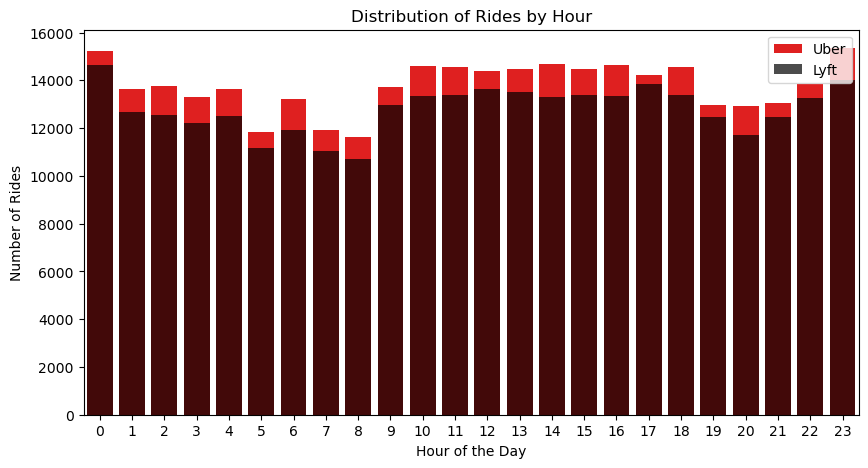

In [17]:
# Plotting Data
plt.figure(figsize=(10, 5))
sns.barplot(x=hour_counts.index, y=hour_counts['Uber'], label='Uber', color='red')
sns.barplot(x=hour_counts.index, y=hour_counts['Lyft'], label='Lyft', color='black', alpha=0.7)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.title('Distribution of Rides by Hour')
plt.legend()
plt.show()

Dari data diatas kita dapat mengetahui bahwa jumlah frekuensi "Distribution of Rides by Hour" paling tinggi adalah pukul 23 dan 00

In [18]:
# Mengelompokkan data berdasarkan hari dan cab_type
daily_counts = df_can.groupby([df_can['datetime'].dt.day, 'cab_type'])['id'].count().unstack().fillna(0)

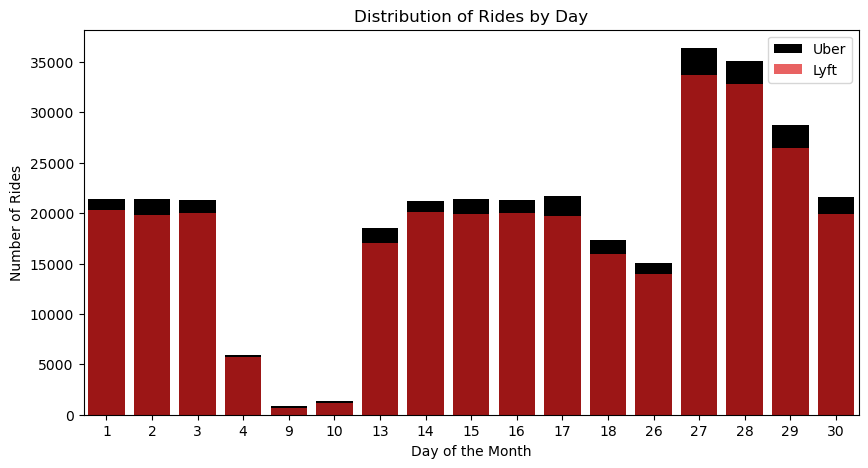

In [19]:
plt.figure(figsize=(10, 5))
sns.barplot(x=daily_counts.index, y=daily_counts['Uber'], label='Uber', color='black')
sns.barplot(x=daily_counts.index, y=daily_counts['Lyft'], label='Lyft', color='red', alpha=0.7)
plt.xlabel('Day of the Month')
plt.ylabel('Number of Rides')
plt.title('Distribution of Rides by Day')
plt.legend()
plt.show()

In [20]:
monthly_counts = df_can.groupby([df_can['datetime'].dt.month, 'cab_type'])['id'].count().unstack().fillna(0)

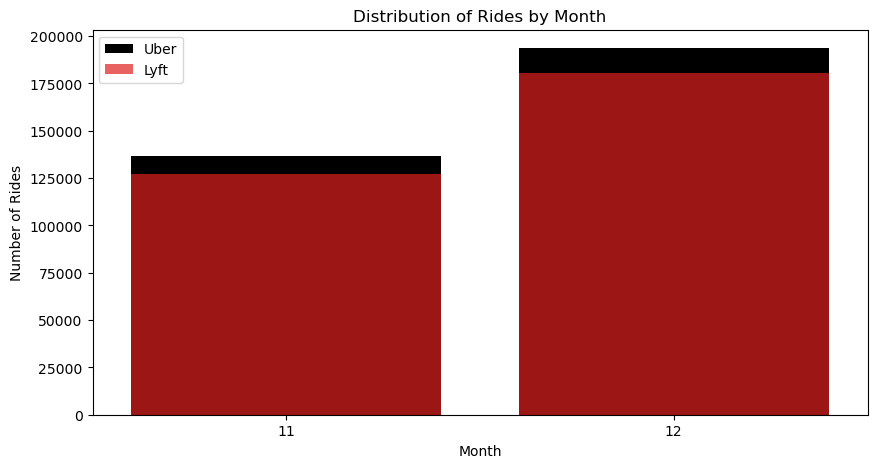

In [21]:
plt.figure(figsize=(10, 5))
sns.barplot(x=monthly_counts.index, y=monthly_counts['Uber'], label='Uber', color='black')
sns.barplot(x=monthly_counts.index, y=monthly_counts['Lyft'], label='Lyft', color='red', alpha=0.7)
plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.title('Distribution of Rides by Month')
plt.legend()
plt.show()

In [22]:
source_counts = df_can.groupby(['source', 'cab_type'])['id'].count().unstack().fillna(0)

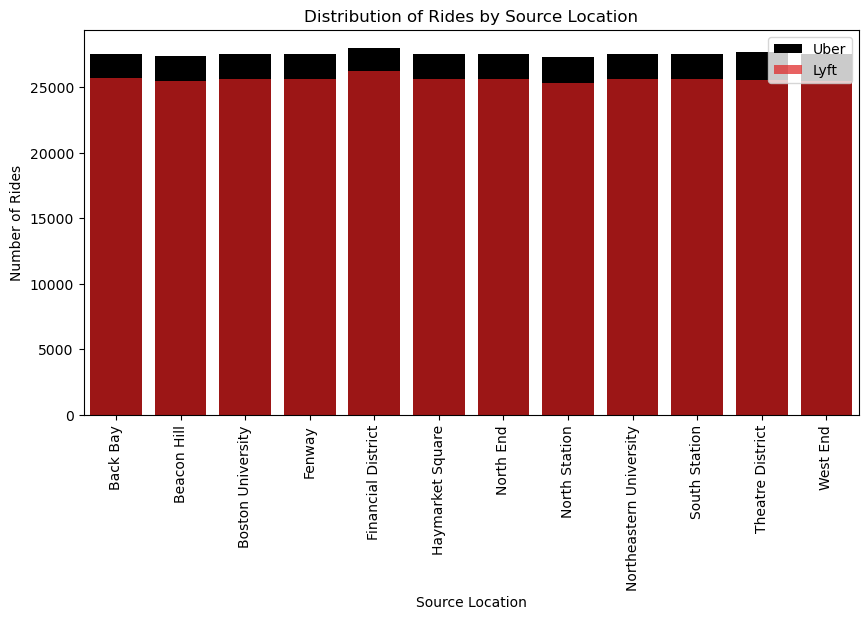

In [23]:
plt.figure(figsize=(10, 5))
sns.barplot(x=source_counts.index, y=source_counts['Uber'], label='Uber', color='black')
sns.barplot(x=source_counts.index, y=source_counts['Lyft'], label='Lyft', color='red', alpha=0.7)
plt.xlabel('Source Location')
plt.ylabel('Number of Rides')
plt.title('Distribution of Rides by Source Location')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [24]:
destination_counts = df_can.groupby(['destination', 'cab_type'])['id'].count().unstack().fillna(0)

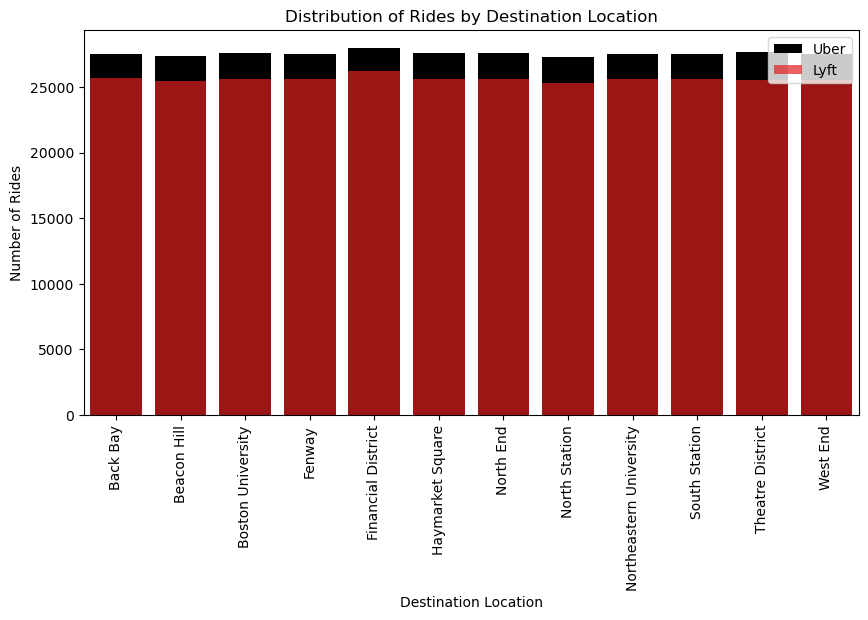

In [25]:
plt.figure(figsize=(10, 5))
sns.barplot(x=destination_counts.index, y=destination_counts['Uber'], label='Uber', color='black')
sns.barplot(x=destination_counts.index, y=destination_counts['Lyft'], label='Lyft', color='red', alpha=0.7)
plt.xlabel('Destination Location')
plt.ylabel('Number of Rides')
plt.title('Distribution of Rides by Destination Location')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [26]:
cab_type_counts = df_can['cab_type'].value_counts()

In [27]:
unique_cab_types = df_can['cab_type'].unique()
print(unique_cab_types)

['Lyft' 'Uber']


In [28]:
print("Counts of each 'cab_type':")
print(cab_type_counts)

Counts of each 'cab_type':
cab_type
Uber    330568
Lyft    307408
Name: count, dtype: int64


In [29]:
total_count = cab_type_counts.sum()
percentage_distribution = (cab_type_counts / total_count) * 100
summary_statistics = cab_type_counts.describe()

In [30]:
print("\nSummary Statistics:")
print(f"Total Count: {total_count}")
print(f"Percentage Distribution:\n{percentage_distribution}")
print("\nSummary Statistics for Count:")
print(summary_statistics)


Summary Statistics:
Total Count: 637976
Percentage Distribution:
cab_type
Uber    51.815115
Lyft    48.184885
Name: count, dtype: float64

Summary Statistics for Count:
count         2.000000
mean     318988.000000
std       16376.593052
min      307408.000000
25%      313198.000000
50%      318988.000000
75%      324778.000000
max      330568.000000
Name: count, dtype: float64


In [31]:
unique_cab_types = df_can['cab_type'].unique()
print(unique_cab_types)

['Lyft' 'Uber']


## EDA (Exploratory Data Analysis)

### Mencari relasi antar kolom numerik 

- Korelasi Positif: Ketika korelasi antara dua variabel mendekati +1, ini menunjukkan hubungan positif. Ini berarti jika nilai salah satu variabel meningkat, kemungkinan besar nilai variabel lain juga akan meningkat. Sebaliknya, jika korelasi mendekati -1, ini menunjukkan hubungan negatif. Korelasi Dekat dengan 0: Jika korelasi mendekati 0, maka tidak ada hubungan linier yang kuat antara kedua variabel tersebut.

- Korelasi Kuat: Korelasi yang mendekati nilai absolut 1 (baik positif atau negatif) menunjukkan hubungan yang kuat antara kedua variabel tersebut. Misalnya, dalam kasus Anda, hubungan antara 'windGust' dan 'cab_type' memiliki korelasi positif yang cukup kuat.

- Korelasi Antar Variabel: Perhatikan bahwa Anda dapat membaca korelasi antara variabel dengan variabel lainnya dalam matriks korelasi. Misalnya, korelasi antara 'cab_type' dan 'distance' adalah 0.001941, yang menunjukkan hubungan yang lemah.

- Perbedaan Korelasi: Perbedaan besar dalam korelasi antara berbagai pasangan variabel dapat memberikan wawasan tentang hubungan yang lebih kuat atau lebih lemah antara variabel-variabel tersebut.

Penting untuk diingat bahwa korelasi hanya mengukur hubungan linier antara dua variabel dan tidak selalu mencerminkan hubungan sebab-akibat. Korelasi juga tidak memerhatikan variabel lain yang mungkin terlibat dalam hubungan. Oleh karena itu, hasil korelasi perlu dianalisis dalam konteks dan ditafsirkan dengan hati-hati.

In [32]:
df = df_can.copy()

In [33]:
df['cab_type'].value_counts()

cab_type
Uber    330568
Lyft    307408
Name: count, dtype: int64

In [34]:
# Transformasi data menjadi numerik
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['cab_type'] = label_encoder.fit_transform(df['cab_type'])

In [35]:
# Memilih kolom numerik saja
numeric_cols = df.select_dtypes(include='number') 

In [36]:
numeric_cols

,timestamp,hour,day,month,cab_type,price,distance,surge_multiplier,latitude,longitude,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,1.544953e+09,9,16,12,0,5.0,0.44,1.0,42.2148,-71.0330,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,1.543284e+09,2,27,11,0,11.0,0.44,1.0,42.2148,-71.0330,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,1.543367e+09,1,28,11,0,7.0,0.44,1.0,42.2148,-71.0330,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,1.543554e+09,4,30,11,0,26.0,0.44,1.0,42.2148,-71.0330,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,1.543463e+09,3,29,11,0,9.0,0.44,1.0,42.2148,-71.0330,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693065,1.543708e+09,23,1,12,1,9.5,1.00,1.0,42.3519,-71.0643,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693066,1.543708e+09,23,1,12,1,13.0,1.00,1.0,42.3519,-71.0643,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693067,1.543708e+09,23,1,12,1,9.5,1.00,1.0,42.3519,-71.0643,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693069,1.543708e+09,23,1,12,1,27.0,1.00,1.0,42.3519,-71.0643,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800


In [37]:
  # Menghitung korelasi Pearson
correlation_matrix = numeric_cols.corr() 
# Menghitung korelasi car_type dengan column lainnya
correlation_with_target = correlation_matrix['cab_type'].sort_values(ascending=False) 
print(correlation_with_target)

cab_type                       1.000000
windSpeed                      0.003427
windGust                       0.002850
precipProbability              0.002572
day                            0.002338
humidity                       0.002237
longitude                      0.002077
distance                       0.001941
precipIntensity                0.001602
temperatureMinTime             0.000920
temperatureLowTime             0.000920
apparentTemperatureLowTime     0.000905
uvIndexTime                    0.000875
sunsetTime                     0.000868
sunriseTime                    0.000867
apparentTemperatureMinTime     0.000865
temperatureHighTime            0.000854
apparentTemperatureHighTime    0.000847
temperatureMaxTime             0.000834
timestamp                      0.000833
apparentTemperatureMaxTime     0.000822
windGustTime                   0.000820
cloudCover                     0.000663
ozone                          0.000488
dewPoint                      -0.000285


In [38]:
top_5_positif = correlation_with_target.nlargest(6)
top_5_negatif = correlation_with_target.nsmallest(5)
print("6 variabel dengan korelasi tertinggi: \n", top_5_positif)
print("5 variabel dengan korelasi tertinggi negatif: \n", top_5_negatif)

6 variabel dengan korelasi tertinggi: 
 cab_type             1.000000
windSpeed            0.003427
windGust             0.002850
precipProbability    0.002572
day                  0.002338
humidity             0.002237
Name: cab_type, dtype: float64
5 variabel dengan korelasi tertinggi negatif: 
 surge_multiplier         -0.163745
price                    -0.083385
temperatureLow           -0.004242
latitude                 -0.004227
apparentTemperatureLow   -0.004123
Name: cab_type, dtype: float64


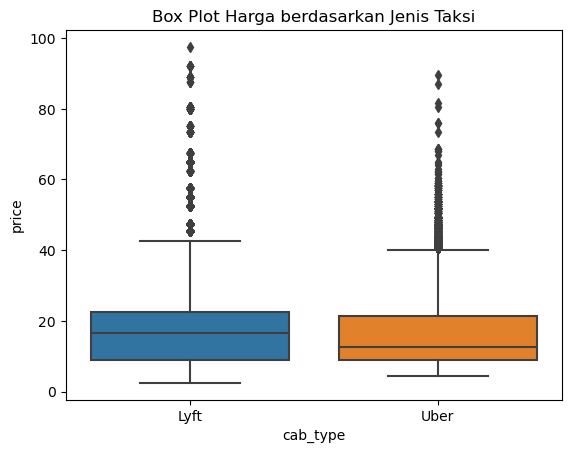

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x='cab_type', y='price', data=df_can)
plt.title('Box Plot Harga berdasarkan Jenis Taksi')
plt.show()

# Central Tendency


In [40]:
import statistics

In [41]:
df[['price', 'distance']]

,price,distance
0,5.0,0.44
1,11.0,0.44
2,7.0,0.44
3,26.0,0.44
4,9.0,0.44
...,...,...
693065,9.5,1.00
693066,13.0,1.00
693067,9.5,1.00
693069,27.0,1.00


## Mean

In [42]:
mean_price = statistics.mean(df['price'])
mean_distance = statistics.mean(df['distance'])

print("Mean of Price : ",mean_price)
print("Mean of Land Square Feet : ",mean_distance)

Mean of Price :  16.545125490614065
Mean of Land Square Feet :  2.189261100731062


## Median

In [43]:
median_price = statistics.median(df['price'])
median_distance = statistics.median(df['distance'])

print("Median of Price : ",median_price)
print("Median of Land Square Feet : ",median_distance)

Median of Price :  13.5
Median of Land Square Feet :  2.16


## Mode

In [44]:
mode_price = statistics.mode(df['price'])
mode_distance = statistics.mode(df['distance'])

print("Mode of Price : ",mode_price)
print("Mode of Land Square Feet : ",mode_distance)

Mode of Price :  7.0
Mode of Land Square Feet :  2.66


In [45]:
df.describe()

,timestamp,hour,day,month,datetime,cab_type,price,distance,surge_multiplier,latitude,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
count,6.379760e+05,637976.000000,637976.000000,637976.000000,637976,637976.000000,637976.000000,637976.000000,637976.000000,637976.000000,...,637976.000000,6.379760e+05,637976.000000,6.379760e+05,637976.000000,6.379760e+05,637976.000000,6.379760e+05,637976.000000,6.379760e+05
mean,1.544046e+09,11.618528,17.797674,11.586550,2018-12-05 21:34:04.918879488,0.518151,16.545125,2.189261,1.015068,42.338161,...,0.037369,1.544044e+09,33.456171,1.544042e+09,45.259945,1.544047e+09,29.729028,1.544048e+09,41.995876,1.544048e+09
min,1.543204e+09,0.000000,1.000000,11.000000,2018-11-26 03:40:46,0.000000,2.500000,0.020000,1.000000,42.214800,...,0.000000,1.543162e+09,15.630000,1.543122e+09,33.510000,1.543154e+09,11.810000,1.543136e+09,28.950000,1.543187e+09
25%,1.543444e+09,6.000000,13.000000,11.000000,2018-11-28 22:26:08,0.000000,9.000000,1.270000,1.000000,42.350300,...,0.000000,1.543421e+09,30.170000,1.543399e+09,42.570000,1.543439e+09,27.760000,1.543399e+09,36.570000,1.543439e+09
50%,1.543737e+09,12.000000,17.000000,12.000000,2018-12-02 07:52:59,1.000000,13.500000,2.160000,1.000000,42.351900,...,0.000400,1.543770e+09,34.240000,1.543727e+09,44.660000,1.543788e+09,30.130000,1.543745e+09,40.950000,1.543788e+09
75%,1.544828e+09,18.000000,28.000000,12.000000,2018-12-14 22:45:04,1.000000,22.500000,2.930000,1.000000,42.364700,...,0.091600,1.544807e+09,38.880000,1.544789e+09,46.910000,1.544814e+09,35.710000,1.544789e+09,44.120000,1.544818e+09
max,1.545161e+09,23.000000,30.000000,12.000000,2018-12-18 19:15:10,1.000000,97.500000,7.860000,3.000000,42.366100,...,0.145900,1.545152e+09,43.100000,1.545192e+09,57.870000,1.545109e+09,40.050000,1.545134e+09,57.200000,1.545109e+09
std,6.892028e+05,6.948776,9.982083,0.492452,NaN,0.499671,9.324359,1.135413,0.095422,0.047856,...,0.055216,6.912268e+05,6.466349,6.902087e+05,5.644414,6.901597e+05,7.109907,6.872011e+05,6.935538,6.911036e+05


# Visualization Folium map with markers
Dalam studi sebaran layanan ride-sharing di kota Boston, kami menggunakan pustaka Python folium untuk memvisualisasikan data. Peta interaktif yang dihasilkan memuat penanda (marker) yang mewakili lokasi sebaran pengemudi dan penumpang dari layanan Uber dan Lyft di berbagai daerah Boston. Informasi yang disajikan dalam peta ini membantu memahami pola sebaran layanan ride-sharing di kota ini, yang dapat berguna dalam analisis transportasi perkotaan dan pengambilan keputusan terkait mobilitas

In [46]:
latitude = 42.2148
longitude = -71.0330

In [47]:
import folium
# Membuat peta Boston dan mengurangi cakupan sekitar 10%
zoom_level = 10
zoom_level -= 1  # Perkecil cakupan sekitar 10%
boston_maps = folium.Map(location=[42.3601, -71.0589], zoom_start=zoom_level)

In [48]:
data_loc = df_can.copy()

In [49]:
limit = 150
data_loc = data_loc.iloc[0:limit, :]

In [50]:
data_loc.shape

(150, 57)

In [51]:
data_uber = data_loc[data_loc['cab_type'] == 'Uber']
data_lyft = data_loc[data_loc['cab_type'] == 'Lyft']

## Sebaran Uber & Lyft di Boston

In [52]:
import folium

# Membuat peta Boston
boston_maps = folium.Map(location=[42.3601, -71.0589], zoom_start=11)

# Menambahkan marker untuk taksi Uber
for index, row in data_uber.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    folium.Marker(location=[latitude, longitude], tooltip="Uber", icon=folium.Icon(color='blue')).add_to(boston_maps)

# Menambahkan marker untuk taksi Lyft
for index, row in data_lyft.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    folium.Marker(location=[latitude, longitude], tooltip="Lyft", icon=folium.Icon(color='green')).add_to(boston_maps)

# Menampilkan peta di Jupyter Notebook
boston_maps

Tampak ada hanya ada beberapa marker saja. Dikarenakan value dari data uber kebanyakan memakai kordinat yang sama. Oleh karena itu untuk mendapatkan jumlah pasti nya akan dilakukan cluster pada folium map.

## Cluster

In [53]:
from folium.plugins import MarkerCluster
marker_cluster_uber = MarkerCluster()
for index, row in data_uber.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    folium.Marker(location=[latitude, longitude], tooltip="Uber").add_to(marker_cluster_uber)

# Membuat cluster marker untuk taksi Lyft
marker_cluster_lyft = MarkerCluster()
for index, row in data_lyft.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    folium.Marker(location=[latitude, longitude], tooltip="Lyft").add_to(marker_cluster_lyft)

In [54]:
# Menambahkan cluster marker ke peta
marker_cluster_uber.add_to(boston_maps)
marker_cluster_lyft.add_to(boston_maps)

In [55]:
boston_maps

Dari map diatas merupakan gambaran umum distribusi Uber dan Lyft di Boston yang sudah dilakukan clustering

# Decision Tree Classifier
Decision tree adalah flowchart-like tree structure di mana internal node mewakili feature(atau atribute), branch mewakili decision rule, dan setiap leaf node mewakili outcome.

Secara umum ada beberapa tujuan Decision tree classifier :
### 1. Tujuan Analisis:

**Prediksi Jenis Taksi:** cab_type adalah variabel dependen atau label yang tepat. Tujuannya adalah memahami bagaimana atribut-atribut lain memengaruhi atau memprediksi jenis taksi yang dipilih oleh pelanggan.
### 2. Klasifikasi Kategori:

**Penentuan Kategori:** Ketika memprediksi kategori atau label, seperti jenis taksi, dalam sebuah tugas klasifikasi memerlukan variabel dependen yang merupakan target prediksi. Dalam hal ini, cab_type akan menjadi label yang akan diprediksi oleh model.
### 3. Penentuan Jenis Taksi:

**Rekomendasi Jenis Taksi:** Model ini memungkinkan untuk memberikan rekomendasi tentang jenis taksi yang paling sesuai berdasarkan atribut lainnya. Misalnya, model dapat membantu pelanggan dalam memilih taksi yang paling efisien atau ekonomis berdasarkan waktu, harga, cuaca, atau faktor lainnya.
### 4. Analisis Pola Konsumen:

**Memahami Preferensi Konsumen:** Dengan menjadikan cab_type sebagai variabel dependen, memungkinkan untuk dapat menganalisis preferensi konsumen terhadap jenis taksi tertentu dan mengidentifikasi pola atau faktor-faktor yang memengaruhi pilihan mereka. Ini dapat membantu dalam pengambilan keputusan bisnis, pemasaran, dan perbaikan layanan.
Dengan menjadikan cab_type sebagai variabel dependen, ini memungkinkan model untuk belajar dari data historis dan melakukan prediksi atau klasifikasi jenis taksi berdasarkan atribut-atribut lainnya. Ini membantu dalam pemahaman lebih mendalam tentang perilaku konsumen dan memberikan landasan untuk pengambilan keputusan yang lebih baik dalam bisnis atau aplikasi yang melibatkan transportasi.

In [56]:
df = df_can.copy()

In [57]:
# Transformasi data menjadi numerik
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['cab_type'] = label_encoder.fit_transform(df['cab_type'])

In [58]:
feature_cols = ['hour', 'day', 'month', 'distance', 'price', 'temperature', 'surge_multiplier', 'precipIntensityMax', 'precipIntensity', 'humidity', 'windSpeed', 'windGust']
X = df_can[feature_cols]
y = df['cab_type']

In [59]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5) # 70% training and 30% test

# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth=6)

In [60]:
# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7455810818577482


## Visualizing Decision Trees

In [61]:
class_names = df['cab_type'].unique().astype(str)

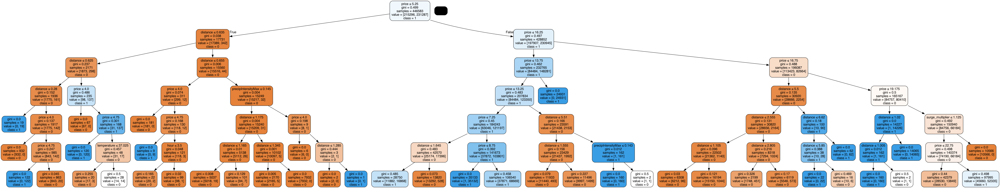

In [62]:
import sklearn.tree as tree
import pydotplus
from six import StringIO 
from IPython.display import Image

dot_data = StringIO()
tree.export_graphviz(clf, out_file=dot_data, 
 class_names=class_names, # the target names.
 feature_names=feature_cols, # the feature names.
 filled=True, # Whether to fill in the boxes with colours.
 rounded=True, # Whether to round the corners of the boxes.
 special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())

## Optimizing Decision Tree Performance

In [63]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

# Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifer correct?
print("Accuracy :", metrics.accuracy_score(y_test, y_pred))

Accuracy : 0.6475785425799272


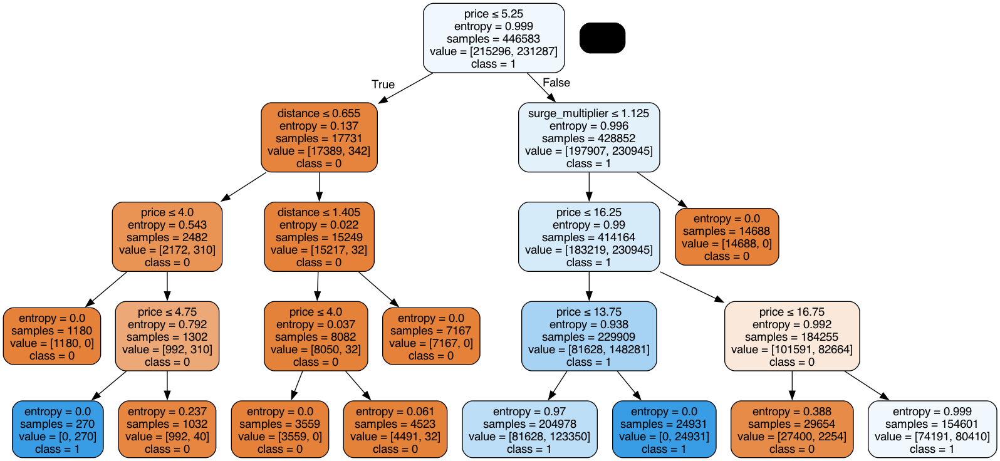

In [64]:
import sklearn.tree as tree
import pydotplus
from six import StringIO
from IPython.display import Image

dot_data = StringIO()
tree.export_graphviz(clf, out_file=dot_data, class_names=['0', '1'], feature_names=feature_cols, filled=True,
                    rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Random Forest

In [65]:
df_ran = df_can.copy()

In [66]:
# Transformasi data menjadi numerik
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
df_ran['cab_type'] = enc.fit_transform(df_ran['cab_type'].values)

In [67]:
from sklearn.model_selection import train_test_split

X = df_ran[['hour', 'distance', 'price', 'temperature', 'surge_multiplier', 'precipIntensityMax', 'precipIntensity', 'humidity', 'windSpeed', 'windGust']]
y = df_ran['cab_type']

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [68]:
from sklearn.ensemble import RandomForestClassifier

# Create a Gaussian Classifier
clf = RandomForestClassifier(n_estimators=80)

# Train the model using the training sets
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [69]:
print("Accuracy: ",metrics.accuracy_score(y_test, y_pred))

Accuracy:  0.8740706295423553


In [70]:
# Memprediksi jenis taksi yang dipilih dengan beberapa feature
clf.predict([[1.282, 16, 42.32, 1,0, 0.123232, 0.0393, 0.76, 1.8, 12.8]])

/Users/fajri/anaconda3/lib/python3.11/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([1])

## Finding Important Features in Scikit Learn

In [71]:
from sklearn.ensemble import RandomForestClassifier 

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=80) 

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

RandomForestClassifier(n_estimators=80)

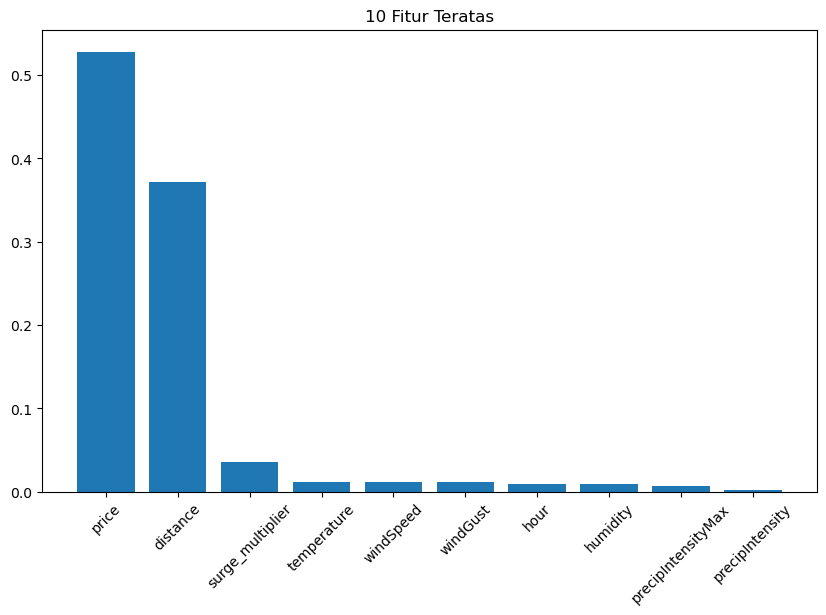

In [72]:
import matplotlib.pyplot as plt
import numpy as np

feature_importances = clf.feature_importances_
feature_names = X_train.columns

sorted_idx = np.argsort(feature_importances)[::-1]
top_features = sorted_idx[:10]  # Ambil 10 fitur teratas

plt.figure(figsize=(10, 6))
plt.bar(range(10), feature_importances[top_features], align="center")
plt.xticks(range(10), np.array(feature_names)[top_features], rotation=45)
plt.title("10 Fitur Teratas")
plt.show()

# LINEAR REGRESSION

Linear Regression adalah metode statistik yang digunakan untuk memodelkan hubungan antara dua variabel dengan menggunakan garis lurus. 

Fungsi utama dari Linear Regression adalah untuk memprediksi nilai variabel dependen (Y) berdasarkan nilai variabel independen (X).

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

In [74]:
df_can.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [75]:
X= np.array(df_can["temperatureMin"]).reshape(-1, 1)
y= df_can["temperatureMax"] #Provide data

In [76]:
reg = LinearRegression()
reg = LinearRegression().fit(X, y) #Create a model and fit it
reg.get_params(deep=True)

{'copy_X': True,
 'fit_intercept': True,
 'n_jobs': None,
 'normalize': 'deprecated',
 'positive': False}

# 𝑅2

Nilai R² berkisar antara 0 dan 1, di mana 0 berarti model tidak menjelaskan variasi sama sekali, dan 1 berarti model menjelaskan seluruh variasi

Jika R² tinggi,dimana nilai R² berkisar antara 0 dan 1, di mana 0 berarti model tidak menjelaskan variasi sama sekali, dan 1 berarti model menjelaskan seluruh variasi. Jika R² tinggi, itu berarti model dengan prediktor yang digunakan telah berhasil menjelaskan sebagian besar variasi dalam variabel dependen.

Jika R² sangat rendah, ini menunjukkan bahwa model regresi tidak menjelaskan banyak variasi dalam variabel dependen dan lebih baik hanya menggunakan nilai rata-rata variabel dependen sebagai prediksi karena model tidak memberikan informasi tambahan yang signifikan.

Jika R² Negatif, ini mungkin terjadi ketika model secara efektif melakukan lebih buruk daripada hanya menggunakan nilai rata-rata dari variabel dependen, sehingga jumlah kuadrat residu (RSS) hampir sama besar dengan jumlah kuadrat total (TSS)

In [77]:
reg.score(X,y)

0.6130595950027029

Akurasi keakuratannya sebesar 61%

In [78]:
reg.predict(np.array([32]).reshape(-1,1))

array([44.26471507])

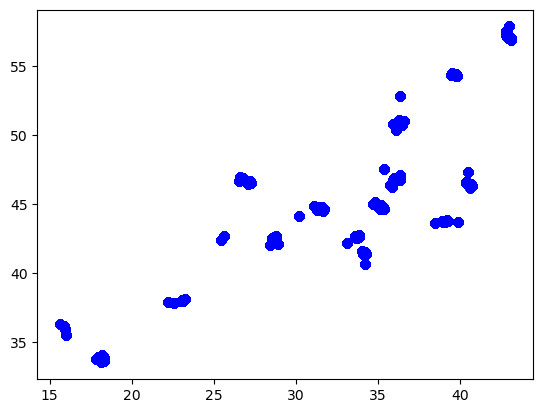

In [79]:
x = df_can["temperatureMin"]
y = df_can["temperatureMax"]
plt.scatter(x, y, c ="blue")
plt.show()

In [80]:
pd. get_option("display.max_columns")
df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,0,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,0,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,0,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,0,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,0,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 637976 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   id                           637976 non-null  object        
 1   timestamp                    637976 non-null  float64       
 2   hour                         637976 non-null  int64         
 3   day                          637976 non-null  int64         
 4   month                        637976 non-null  int64         
 5   datetime                     637976 non-null  datetime64[ns]
 6   timezone                     637976 non-null  object        
 7   source                       637976 non-null  object        
 8   destination                  637976 non-null  object        
 9   cab_type                     637976 non-null  int64         
 10  product_id                   637976 non-null  object        
 11  name                         63

In [82]:
df.describe()

,timestamp,hour,day,month,datetime,cab_type,price,distance,surge_multiplier,latitude,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
count,6.379760e+05,637976.000000,637976.000000,637976.000000,637976,637976.000000,637976.000000,637976.000000,637976.000000,637976.000000,...,637976.000000,6.379760e+05,637976.000000,6.379760e+05,637976.000000,6.379760e+05,637976.000000,6.379760e+05,637976.000000,6.379760e+05
mean,1.544046e+09,11.618528,17.797674,11.586550,2018-12-05 21:34:04.918879488,0.518151,16.545125,2.189261,1.015068,42.338161,...,0.037369,1.544044e+09,33.456171,1.544042e+09,45.259945,1.544047e+09,29.729028,1.544048e+09,41.995876,1.544048e+09
min,1.543204e+09,0.000000,1.000000,11.000000,2018-11-26 03:40:46,0.000000,2.500000,0.020000,1.000000,42.214800,...,0.000000,1.543162e+09,15.630000,1.543122e+09,33.510000,1.543154e+09,11.810000,1.543136e+09,28.950000,1.543187e+09
25%,1.543444e+09,6.000000,13.000000,11.000000,2018-11-28 22:26:08,0.000000,9.000000,1.270000,1.000000,42.350300,...,0.000000,1.543421e+09,30.170000,1.543399e+09,42.570000,1.543439e+09,27.760000,1.543399e+09,36.570000,1.543439e+09
50%,1.543737e+09,12.000000,17.000000,12.000000,2018-12-02 07:52:59,1.000000,13.500000,2.160000,1.000000,42.351900,...,0.000400,1.543770e+09,34.240000,1.543727e+09,44.660000,1.543788e+09,30.130000,1.543745e+09,40.950000,1.543788e+09
75%,1.544828e+09,18.000000,28.000000,12.000000,2018-12-14 22:45:04,1.000000,22.500000,2.930000,1.000000,42.364700,...,0.091600,1.544807e+09,38.880000,1.544789e+09,46.910000,1.544814e+09,35.710000,1.544789e+09,44.120000,1.544818e+09
max,1.545161e+09,23.000000,30.000000,12.000000,2018-12-18 19:15:10,1.000000,97.500000,7.860000,3.000000,42.366100,...,0.145900,1.545152e+09,43.100000,1.545192e+09,57.870000,1.545109e+09,40.050000,1.545134e+09,57.200000,1.545109e+09
std,6.892028e+05,6.948776,9.982083,0.492452,NaN,0.499671,9.324359,1.135413,0.095422,0.047856,...,0.055216,6.912268e+05,6.466349,6.902087e+05,5.644414,6.901597e+05,7.109907,6.872011e+05,6.935538,6.911036e+05


so there are almost 46 columns with numerical value we will hand-picked a few to explain a regression model to predict **price**.

In [83]:
columns = ["month","day","hour","distance","surge_multiplier","cab_type","latitude","longitude","temperature","precipIntensity","precipProbability","humidity","windSpeed","windGust","dewPoint","pressure","ozone","price"]
analysis_df = df[columns]

In [84]:
analysis_df.head()

,month,day,hour,distance,surge_multiplier,cab_type,latitude,longitude,temperature,precipIntensity,precipProbability,humidity,windSpeed,windGust,dewPoint,pressure,ozone,price
0,12,16,9,0.44,1.0,0,42.2148,-71.033,42.34,0.0000,0.0,0.68,8.66,9.17,32.70,1021.98,303.8,5.0
1,11,27,2,0.44,1.0,0,42.2148,-71.033,43.58,0.1299,1.0,0.94,11.98,11.98,41.83,1003.97,291.1,11.0
2,11,28,1,0.44,1.0,0,42.2148,-71.033,38.33,0.0000,0.0,0.75,7.33,7.33,31.10,992.28,315.7,7.0
3,11,30,4,0.44,1.0,0,42.2148,-71.033,34.38,0.0000,0.0,0.73,5.28,5.28,26.64,1013.73,291.1,26.0
4,11,29,3,0.44,1.0,0,42.2148,-71.033,37.44,0.0000,0.0,0.70,9.14,9.14,28.61,998.36,347.7,9.0


Though this notebook is all about linear regression and i have choosen only the numeric variable (ordinal and ratio) as independent variables. Still we are going to plot some graphs to analyze the data better. 

## Visualization
### 1. Time Trend Analysis

In [85]:
import plotly.express as px

In [86]:
df =analysis_df.groupby(by=["month"]).size().reset_index(name="counts")
df

,month,counts
0,11,263771
1,12,374205


In [87]:
px.bar(data_frame=df, x="month", y="counts", color="month", barmode="group")

In [88]:
df =analysis_df.groupby(by=["day"]).size().reset_index(name="counts")
df

,day,counts
0,1,41680
1,2,41298
2,3,41323
3,4,11627
4,9,1529
5,10,2534
6,13,35496
7,14,41344
8,15,41332
9,16,41359


In [89]:
px.bar(data_frame=df, x="day", y="counts", color="day", barmode="group")

In [90]:
df =analysis_df.groupby(by=["hour"]).size().reset_index(name="counts")
px.bar(data_frame=df, x="hour", y="counts", color="hour", barmode="group")

In [91]:
df =analysis_df.groupby(by=["month","cab_type"]).size().reset_index(name="counts")
px.bar(data_frame=df, x="month", y="counts", color="cab_type", barmode="group")

In [92]:
df =analysis_df.groupby(by=["day","cab_type"]).size().reset_index(name="counts")
px.bar(data_frame=df, x="day", y="counts", color="cab_type", barmode="group")

In [93]:
df =analysis_df.groupby(by=["hour","cab_type"]).size().reset_index(name="counts")
px.bar(data_frame=df, x="hour", y="counts", color="cab_type", barmode="group")

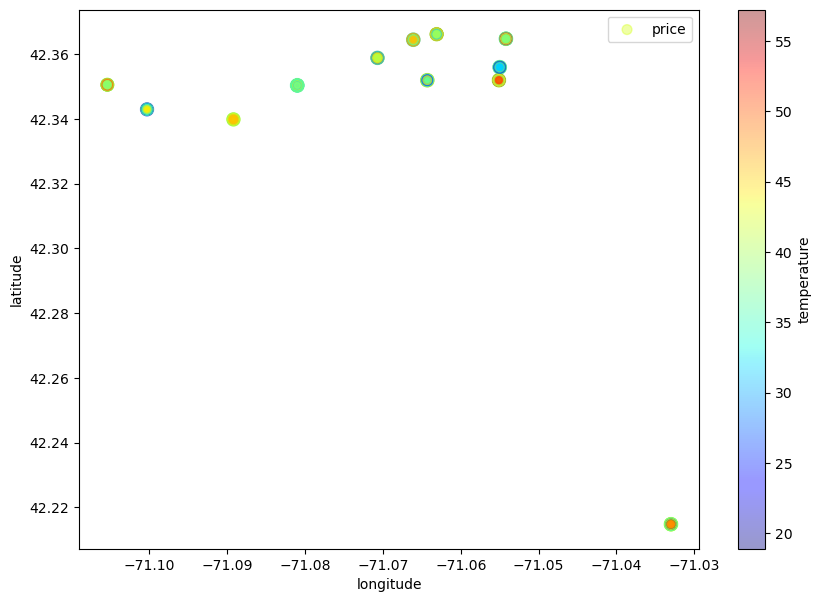

In [94]:
analysis_df.plot(kind="scatter", x="longitude", y="latitude",
    s=analysis_df['price'], label="price",
    c="temperature", cmap=plt.get_cmap("jet"),
    colorbar=True, alpha=0.4, figsize=(10,7),
)
plt.legend()
plt.show()

# Price Analysis

In [95]:
import plotly.figure_factory as ff

In [96]:
import random
random.seed(100)

In [97]:
viz_df = analysis_df.sample(frac =.25)

In [98]:
fig = ff.create_distplot([viz_df["price"].dropna().values.tolist()], group_labels=['distplot'])
fig.show()

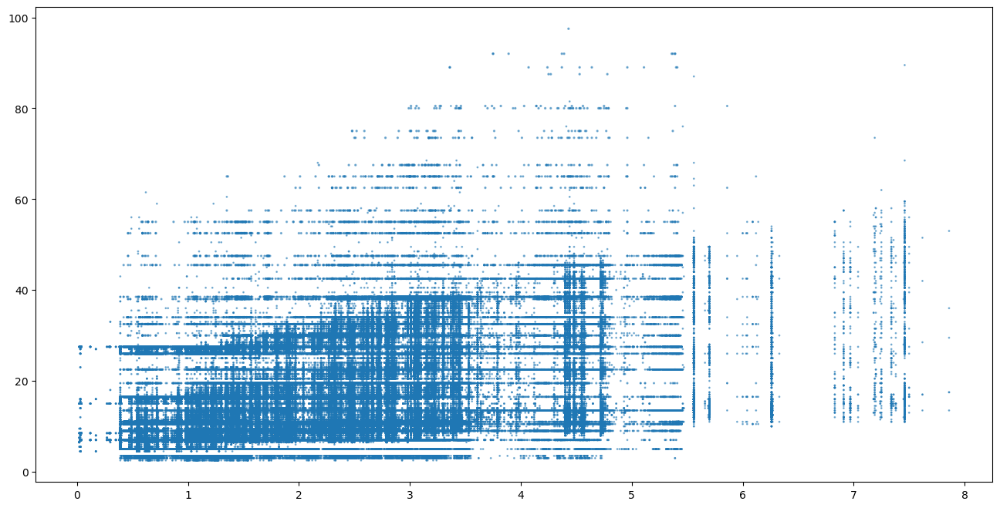

In [99]:
plt.figure(figsize=(16,8))
plt.scatter(x=analysis_df["distance"], y=analysis_df["price"], s=analysis_df["surge_multiplier"], alpha=0.5)
plt.show()

In [100]:
surge_data = analysis_df[analysis_df["surge_multiplier"]>2.0]

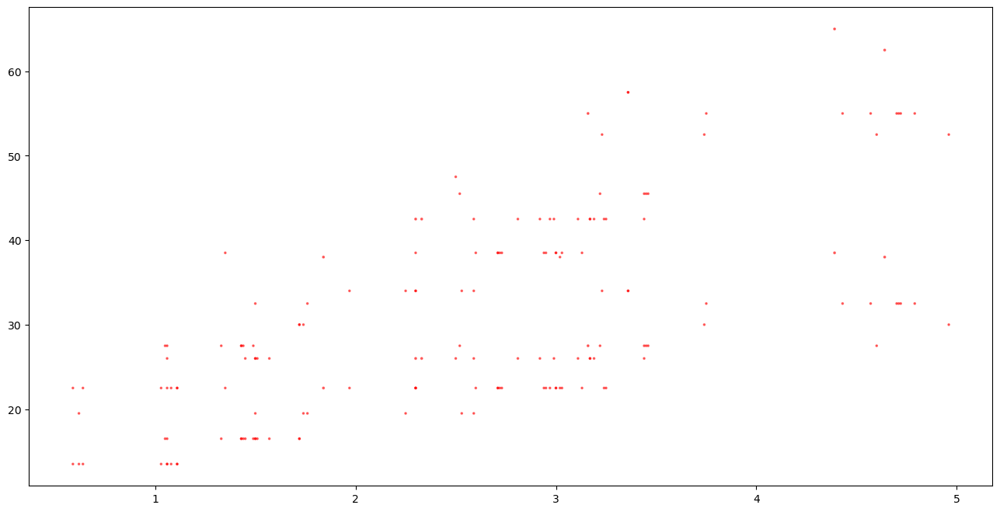

In [101]:
plt.figure(figsize=(16,8))
plt.scatter(x=surge_data["distance"], y=surge_data["price"], marker='o', c='r',s=surge_data["surge_multiplier"], alpha=0.5)
plt.show()

## Linear Model


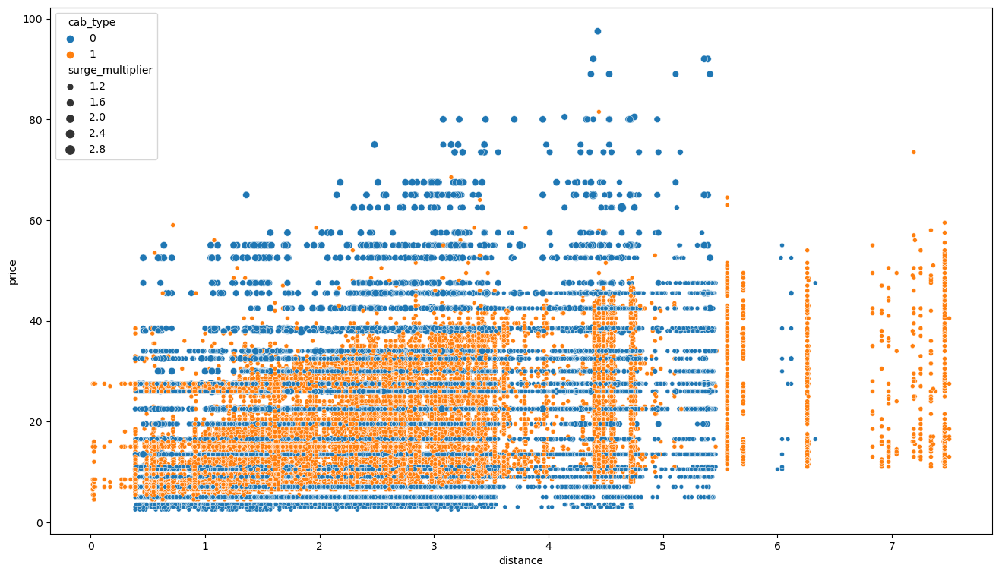

In [102]:
df = analysis_df[(analysis_df["hour"]>=22) | (analysis_df["hour"]<=4)]
plt.figure(figsize=(16,9))
sns.scatterplot(data = df, x = "distance",
                y = "price", hue = "cab_type", size = "surge_multiplier")
plt.show()

Inference:

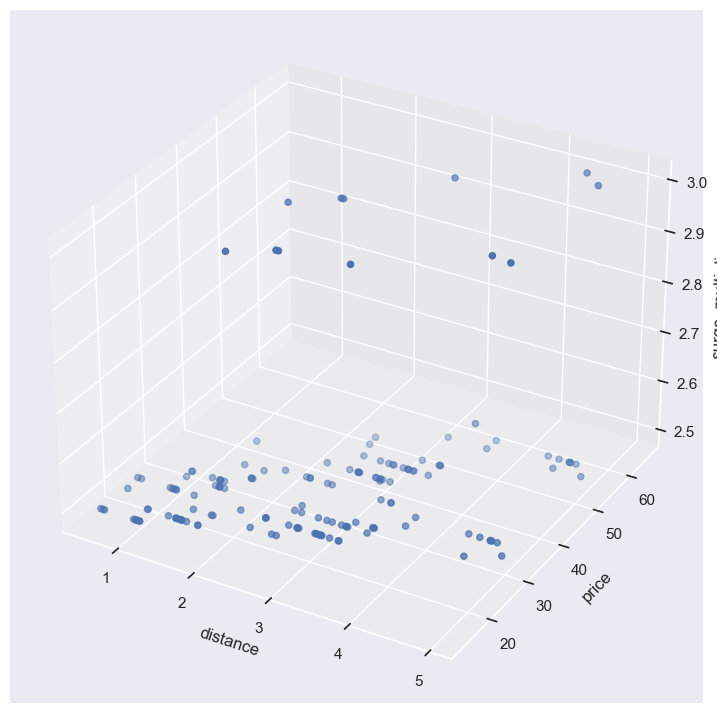

In [103]:
import seaborn as sns
sns.set(style = "darkgrid")

fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(111, projection = '3d')
x = surge_data['distance']
y = surge_data['price']
z = surge_data['surge_multiplier']

ax.set_xlabel("distance")
ax.set_ylabel("price")
ax.set_zlabel("surge_multiplier")

ax.scatter(x, y, z)

plt.show()

In [104]:
linear_df = analysis_df[["distance","surge_multiplier","price"]]

In [105]:
linear_df.dropna(inplace = True)

In [106]:
#separate the other attributes from the predicting attribute
x = linear_df.drop("price",axis=1)
#separte the predicting attribute into Y for model training 
y = linear_df["price"]

In [107]:
# importing train_test_split from sklearn
from sklearn.model_selection import train_test_split
# splitting the data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [108]:
# importing module
from sklearn.linear_model import LinearRegression
# creating an object of LinearRegression class
LR = LinearRegression()
# fitting the training data
LR.fit(x_train,y_train)

LinearRegression()

In [109]:
y_prediction =  LR.predict(x_test)

In [110]:
# importing r2_score module
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
# predicting the accuracy score
score=r2_score(y_test,y_prediction)
print('r2 socre is ',score)
print('mean_sqrd_error is==',mean_squared_error(y_test,y_prediction))
print('root_mean_squared error of is==',np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is  0.17502695205749397
mean_sqrd_error is== 71.92149895182435
root_mean_squared error of is== 8.48065439407976


In [111]:
import statsmodels.api as sm
from scipy import stats

X2 = sm.add_constant(x)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.173
Model:                            OLS   Adj. R-squared:                  0.173
Method:                 Least Squares   F-statistic:                 6.659e+04
Date:                Fri, 27 Oct 2023   Prob (F-statistic):               0.00
Time:                        22:45:37   Log-Likelihood:            -2.2691e+06
No. Observations:              637976   AIC:                         4.538e+06
Df Residuals:                  637973   BIC:                         4.538e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -12.5290      0.115  

In [112]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

print(tf.__version__)

2023-10-27 22:45:56.051783: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2.14.0


In [113]:
train_dataset = linear_df.sample(frac=0.8, random_state=0)
test_dataset = linear_df.drop(train_dataset.index)

/Users/fajri/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



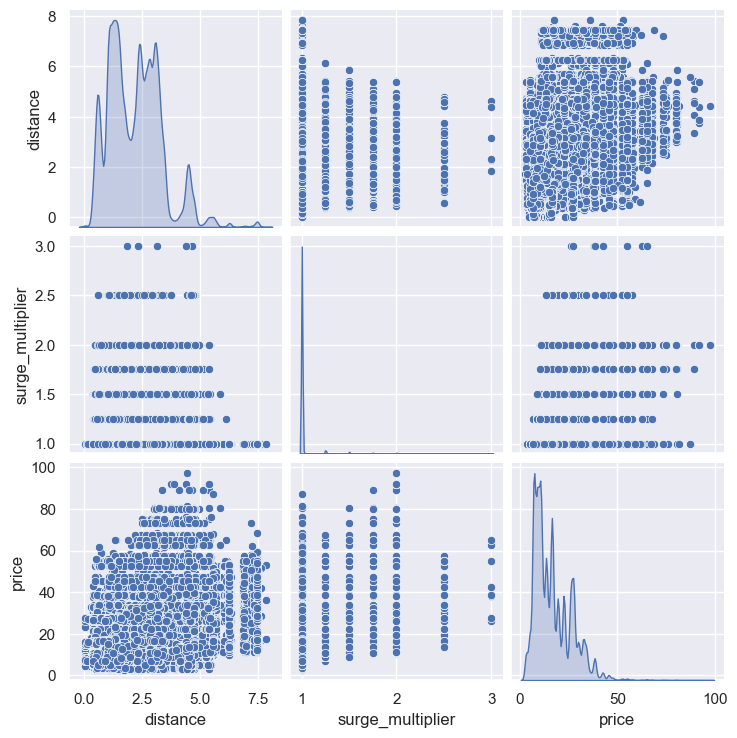

In [114]:
import seaborn as sns
sns.pairplot(train_dataset,diag_kind='kde')

In [115]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('price')
test_labels = test_features.pop('price')

In [116]:
normalizer = preprocessing.Normalization(axis=-1)
normalizer.adapt(np.array(train_features))
print(normalizer.mean.numpy())

[[2.1897483 1.0150477]]


In [117]:
linear_model = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])

In [118]:
linear_model.predict(train_features[:10])

1/1 [==============================] - 0s 164ms/step


array([[ 0.05997107],
       [-0.7005952 ],
       [ 0.32571104],
       [-0.0683173 ],
       [ 0.26156688],
       [-0.20118728],
       [ 2.1629822 ],
       [ 0.32571104],
       [-0.42569172],
       [-0.5677252 ]], dtype=float32)

In [119]:
linear_model.layers[1].kernel

<tf.Variable 'dense/kernel:0' shape=(2, 1) dtype=float32, numpy=
array([[0.52041006],
       [0.1722703 ]], dtype=float32)>

In [120]:
linear_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error')

In [121]:
%%time
history = linear_model.fit(
    train_features, train_labels, 
    epochs=10,
    verbose=2,
    validation_split = 0.2)

Epoch 1/10
12760/12760 - 51s - loss: 6.8708 - val_loss: 6.8137 - 51s/epoch - 4ms/step
Epoch 2/10
12760/12760 - 39s - loss: 6.8248 - val_loss: 6.8192 - 39s/epoch - 3ms/step
Epoch 3/10
12760/12760 - 32s - loss: 6.8248 - val_loss: 6.8243 - 32s/epoch - 2ms/step
Epoch 4/10
12760/12760 - 28s - loss: 6.8245 - val_loss: 6.8144 - 28s/epoch - 2ms/step
Epoch 5/10
12760/12760 - 28s - loss: 6.8244 - val_loss: 6.8500 - 28s/epoch - 2ms/step
Epoch 6/10
12760/12760 - 30s - loss: 6.8243 - val_loss: 6.8217 - 30s/epoch - 2ms/step
Epoch 7/10
12760/12760 - 28s - loss: 6.8242 - val_loss: 6.8299 - 28s/epoch - 2ms/step
Epoch 8/10
12760/12760 - 27s - loss: 6.8248 - val_loss: 6.8255 - 27s/epoch - 2ms/step
Epoch 9/10
12760/12760 - 27s - loss: 6.8242 - val_loss: 6.8137 - 27s/epoch - 2ms/step
Epoch 10/10
12760/12760 - 28s - loss: 6.8241 - val_loss: 6.8216 - 28s/epoch - 2ms/step
CPU times: user 6min 44s, sys: 47.6 s, total: 7min 32s
Wall time: 5min 19s


In [122]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
5,6.824271,6.821665,5
6,6.824164,6.829866,6
7,6.824808,6.825498,7
8,6.824174,6.813720,8
9,6.824072,6.821609,9


In [123]:
import matplotlib.pyplot as plt
def plot_loss(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 10])
  plt.xlabel('Epoch')
  plt.ylabel('Error [MPG]')
  plt.legend()
  plt.grid(True)

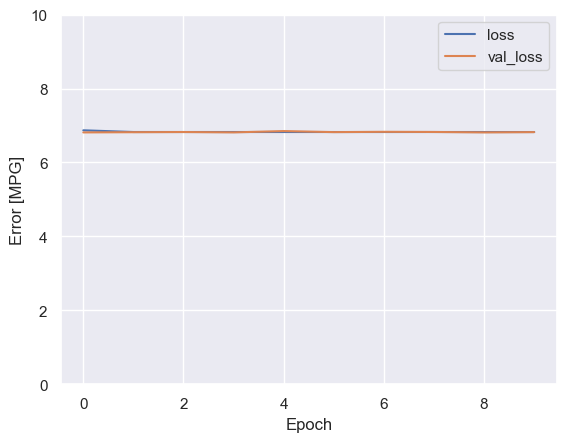

In [124]:
plot_loss(history)

# K-Nearest Neighbors

## Overview Model K-Nearest Neighbors (KNN)

K-Nearest Neighbors (KNN) adalah salah satu algoritma pembelajaran mesin yang digunakan untuk masalah klasifikasi dan regresi. Model ini didasarkan pada konsep bahwa objek yang serupa cenderung berada dekat satu sama lain dalam ruang fitur. Berikut beberapa poin penting terkait dengan KNN:

### Cara Kerja

1. **Menentukan Nilai K**: Pada awalnya, kita harus memilih jumlah tetangga terdekat (K) yang akan digunakan dalam proses klasifikasi atau regresi. Nilai K yang tepat dapat memengaruhi performa model.

2. **Perhitungan Jarak**: KNN menghitung jarak antara titik data yang akan diprediksi dan semua titik data dalam set training. Metrik jarak yang umum digunakan adalah Euclidean distance atau Manhattan distance. Kita dapat memilih metrik jarak yang sesuai dengan karakteristik data.

3. **Menentukan Tetangga Terdekat**: KNN memilih K titik data dengan jarak terdekat ke titik data yang akan diprediksi.

4. **Voting (Klasifikasi) atau Rata-rata (Regresi)**: Dalam klasifikasi, KNN melakukan voting mayoritas dari label neighbors untuk menentukan label dari titik data yang akan diprediksi. Dalam regresi, KNN menghitung rata-rata nilai dari tetangga untuk memprediksi nilai kontinu.

### Hyperparameter KNN

- **n_neighbors**: Jumlah neighbors terdekat yang akan digunakan dalam proses prediksi. Pemilihan nilai K yang optimal sangat penting, karena nilai yang terlalu kecil dapat menyebabkan model sensitif terhadap noise (outlier), sedangkan nilai yang terlalu besar dapat menghilangkan aspek lokalitas.
- **metric**: Metrik jarak yang akan digunakan, seperti 'euclidean' (jarak Euclidean) atau 'manhattan' (jarak Manhattan).
- **weights**: Menentukan cara memberi bobot pada tetangga. 'uniform' memberikan bobot yang sama pada semua tetangga, sementara 'distance' memberikan bobot berdasarkan kebalikan jarak.

### Keuntungan

- Dapat diterapkan terhadap data dengan berbagai macam distribusi
- Contoh, data tidak harus dapat dipisahkan dengan garis linear
- Sangat mudah dan intuitif
- Merupakan klasifikasi yang baik jika jumlah sampel yang tersedia cukup besar.

### Kelemahan

- Menentukan k dapat menjadi sulit
- Tahap testing memerlukan komputasi yang mahal
- Tidak memiliki tahapan training, seluruh proses dilakukan pada tahap testing
- Hal ini bertolak belakang dengan yang diinginkan. Biasanya tahap training memakan waktu yang lama, sedangkan kita menginginkan tahap testing yang cepat.
- Memerlukan sampel dalam jumlah besar untuk memperoleh akurasi yang baik.

### Evaluasi

- Untuk mengevaluasi performa model KNN, umumnya digunakan metrik seperti akurasi (untuk klasifikasi) atau Mean Squared Error (MSE) (untuk regresi).
- Cross-validation sering digunakan untuk menghindari overfitting dan menentukan parameter K yang optimal.

KNN adalah algoritma yang sering digunakan untuk melakukan data imputation.


### Melakukan Data Preprocessing KNN

In [125]:
df = df_can.drop(['id','source', 'destination', 'product_id','name', 'latitude', 'longitude', 'apparentTemperature', 'short_summary', 'long_summary',
            'temperatureHigh', 'temperatureHighTime', 'temperatureLow', 'temperatureLowTime', 'apparentTemperatureHigh', 'apparentTemperatureHighTime',
            'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon', 'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex', 'visibility.1', 'ozone',
            'sunriseTime', 'sunsetTime', 'moonPhase', 'temperatureMinTime', 'temperatureMaxTime', 'apparentTemperatureMinTime', 'apparentTemperatureMaxTime'], axis = 1)

In [126]:
# Transformasi data menjadi numerik
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
df['cab_type'] = enc.fit_transform(df['cab_type'].values)

In [127]:
df.head()

,timestamp,hour,day,month,datetime,timezone,cab_type,price,distance,surge_multiplier,...,windSpeed,windGust,windGustTime,visibility,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMax,apparentTemperatureMin,apparentTemperatureMax
0,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,0,5.0,0.44,1.0,...,8.66,9.17,1545015600,10.000,0.1276,1544979600,39.89,43.68,33.73,38.07
1,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,0,11.0,0.44,1.0,...,11.98,11.98,1543291200,4.786,0.1300,1543251600,40.49,47.30,36.20,43.92
2,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,0,7.0,0.44,1.0,...,7.33,7.33,1543334400,10.000,0.1064,1543338000,35.36,47.55,31.04,44.12
3,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,0,26.0,0.44,1.0,...,5.28,5.28,1543514400,10.000,0.0000,1543507200,34.67,45.03,30.30,38.53
4,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,0,9.0,0.44,1.0,...,9.14,9.14,1543446000,10.000,0.0001,1543420800,33.10,42.18,29.11,35.75


In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 637976 entries, 0 to 693070
Data columns (total 24 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   timestamp               637976 non-null  float64       
 1   hour                    637976 non-null  int64         
 2   day                     637976 non-null  int64         
 3   month                   637976 non-null  int64         
 4   datetime                637976 non-null  datetime64[ns]
 5   timezone                637976 non-null  object        
 6   cab_type                637976 non-null  int64         
 7   price                   637976 non-null  float64       
 8   distance                637976 non-null  float64       
 9   surge_multiplier        637976 non-null  float64       
 10  temperature             637976 non-null  float64       
 11  precipIntensity         637976 non-null  float64       
 12  precipProbability       637976 non-

In [129]:
# Transformasi data menjadi numerik
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
df['cab_type'] = enc.fit_transform(df['cab_type'].values)

In [130]:
# Mengubah kolom 'datetime' menjadi objek datetime
df['datetime'] = pd.to_datetime(df['datetime'])

In [131]:
df_knn = df.copy()

In [132]:
df_knn['datetime']

0        2018-12-16 09:30:07
1        2018-11-27 02:00:23
2        2018-11-28 01:00:22
3        2018-11-30 04:53:02
4        2018-11-29 03:49:20
                 ...        
693065   2018-12-01 23:53:05
693066   2018-12-01 23:53:05
693067   2018-12-01 23:53:05
693069   2018-12-01 23:53:05
693070   2018-12-01 23:53:05
Name: datetime, Length: 637976, dtype: datetime64[ns]

In [133]:
df_knn['datetime_unix'] = df_knn['datetime'].apply(lambda x: x.timestamp())
df_knn = df_knn.drop(columns=['datetime', 'timezone'])
df_knn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 637976 entries, 0 to 693070
Data columns (total 23 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   timestamp               637976 non-null  float64
 1   hour                    637976 non-null  int64  
 2   day                     637976 non-null  int64  
 3   month                   637976 non-null  int64  
 4   cab_type                637976 non-null  int64  
 5   price                   637976 non-null  float64
 6   distance                637976 non-null  float64
 7   surge_multiplier        637976 non-null  float64
 8   temperature             637976 non-null  float64
 9   precipIntensity         637976 non-null  float64
 10  precipProbability       637976 non-null  float64
 11  humidity                637976 non-null  float64
 12  windSpeed               637976 non-null  float64
 13  windGust                637976 non-null  float64
 14  windGustTime            6

In [134]:
df_knn.dropna(inplace=True)

In [135]:
X = df_knn.drop('cab_type', axis=1)
y = df_knn['cab_type']

In [136]:
def count_outliers_iqr(df):
    outlier_counts = pd.DataFrame(columns=['Attribute', 'Outlier Count', 'Lower Bound', 'Upper Bound'])

    for column in df.columns:
        if pd.api.types.is_numeric_dtype(df[column]):
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
            outlier_count = len(outliers)
            outlier_counts = outlier_counts._append({'Attribute': column, 'Outlier Count': outlier_count, 'Lower Bound': lower_bound, 'Upper Bound': upper_bound}, ignore_index=True)

    return outlier_counts

In [137]:
data_outlier = count_outliers_iqr(df_knn)
data_outlier

,Attribute,Outlier Count,Lower Bound,Upper Bound
0,timestamp,0,1.541369e+09,1.546903e+09
1,hour,0,-1.200000e+01,3.600000e+01
2,day,0,-9.500000e+00,5.050000e+01
3,month,0,9.500000e+00,1.350000e+01
4,cab_type,0,-1.500000e+00,2.500000e+00
5,price,5589,-1.125000e+01,4.275000e+01
6,distance,6672,-1.220000e+00,5.420000e+00
7,surge_multiplier,20975,1.000000e+00,1.000000e+00
8,temperature,33749,2.575500e+01,5.427500e+01
9,precipIntensity,138748,0.000000e+00,0.000000e+00


Karena data diatas memiliki banyak outlier maka dapat menggunakan minimal 3 neighbors agar data tidak bergabung dengan outlier.<br>
k yang lebih besar mungkin memperbaiki performance, namun k yang terlalu 
besar menghilangkan aspek lokalitas.

### Pembuatan Model KNN

Train test split dengan size 8:2

In [138]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

Menggunakan standardscaler

In [139]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [140]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

## Melakukan prediksi knn

In [141]:
y_pred = knn.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 0.7751261795040597
Precision: 0.8058559145388223
Recall: 0.7468795749883032


Menampilkan confusion matrix

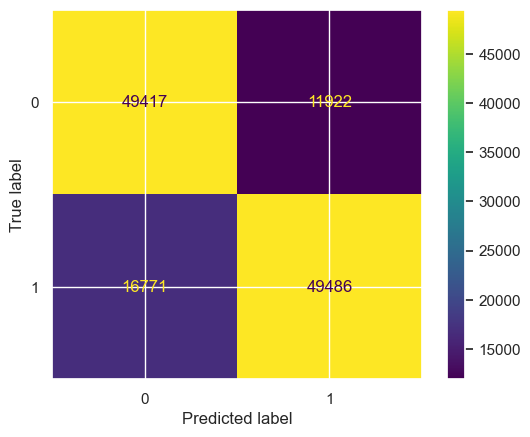

In [142]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot();

Dari data tersebut terlihat bahwa,<br>
TN (True Negative) = 49417<br>
TP (True Positive) = 49486<br>
FN (False Negative) = 16771<br>
FP (False Positive) = 11922<br>

### Optimisasi KNN

In [ ]:
knn_grid = KNeighborsClassifier()

param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2] 
}

grid_search = GridSearchCV(knn_grid, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X, y)

Setelah dijalankan, accuracy tertinggi didapatkan pada n_neighbors=5, dan weights='distance'

In [107]:
knn_best = KNeighborsClassifier(n_neighbors=5, weights='distance')
knn_best.fit(X_train, y_train)

KNeighborsClassifier(weights='distance')

In [108]:
y_pred_best = knn_best.predict(X_test)

accuracy_best = accuracy_score(y_test, y_pred_best)
precision_best = precision_score(y_test, y_pred_best)
recall_best = recall_score(y_test, y_pred)

print("Accuracy:", accuracy_best)
print("Precision:", precision_best)
print("Recall:", recall_best)

Accuracy: 0.7971409762061507
Precision: 0.8220616155331132
Recall: 0.7468795749883032


Terlihat terdapat peningkatan accuracy dari prediksi

### Kesimpulan KNN

Setelah dilakukan beberapa pengujian, dapat dilihat bahwa nilai K sangat mempengaruhi keakuratan model. Selain itu, nilai bobot dari jarak tersebut juga mempengaruhi. 

<img src="https://i.ibb.co/KVFkQjM/qewdfs.png" alt="klasifikasi-tes" width="40%">

- Accuracy, ini merupakan tingkat ketepatan antara prediksi dan hasil sebenarnya. Semakin tinggi semakin bagus
- F1-Score, F1-score baru akan besar kalau kedua nilai precision dan recall besar. Jika ada salah satu yang rendah, maka nilai F1 juga akan rendah
- Recall, merupakan True Positive Rate
- Precision, merupakan TP/(TP+FP)

Dari data sebelum optimisasi dan setelah optimisasi, didapatkan bahwa nilai accuracy, precision, dan recall meningkat yang menandakan bahwa terjadi peningkatan performa model.

## Naive Bayes

## Summary Naive Bayes

Naive Bayes adalah salah satu algoritma klasifikasi dalam machine learning yang berdasarkan teori probabilitas. Gaussian NB adalah variasi dari algoritma Naive Bayes yang digunakan ketika data yang diamati memiliki distribusi Gaussian. Berikut adalah poin-poin terkait Gaussian Naive Bayes:

## 1. Dasar Teori

![Datacamp](https://images.datacamp.com/image/upload/f_auto,q_auto:best/v1543836882/image_3_ijznzs.png)

P(h): probabilitas hipotesis h menjadi benar (tanpa mempertimbangkan data). Ini dikenal sebagai probabilitas prior dari h.<br>
P(D): probabilitas data (tanpa mempertimbangkan hipotesis). Ini dikenal sebagai probabilitas prior.<br>
P(h|D): probabilitas hipotesis h yang diberikan data D. Ini dikenal sebagai probabilitas posterior.<br>
P(D|h): probabilitas data d diberikan bahwa hipotesis h benar. Ini dikenal sebagai probabilitas posterior.<br>

Gaussian Naive Bayes mengandalkan Teorema Bayes untuk menghitung probabilitas posterior kelas dari sebuah sampel, dengan asumsi bahwa fitur-fitur yang diamati dalam sampel mengikuti distribusi Gaussian. Dalam hal ini, "Naive" berarti asumsi bahwa setiap fitur adalah independen, meskipun dalam dunia nyata, independensi ini seringkali tidak terpenuhi.

## 2. Asumsi Distribusi Gaussian

Gaussian Naive Bayes bekerja dengan baik ketika data yang diamati memiliki distribusi Gaussian atau mendekati distribusi Gaussian. Ini berarti data kontinu yang terdistribusi normal cenderung memberikan hasil yang baik dengan algoritma ini.

## 3. Penggunaan

Gaussian Naive Bayes sering digunakan dalam aplikasi klasifikasi, terutama di mana data memiliki sifat distribusi Gaussian. Contoh penggunaan yang umum termasuk klasifikasi email spam atau non-spam, handwriting re, dan identifikasi pola medis.

## 4. Kelebihan

- Sederhana dan cepat dalam pelatihan dan prediksi.
- Cocok untuk data dengan banyak fitur.

## 5. Keterbatasan

- Mengasumsikan bahwa fitur-fitur adalah independen, yang mungkin tidak benar dalam banyak situasi.
- Kinerja buruk jika asumsi distribusi Gaussian tidak terpenuhi.

Gaussian Naive Bayes adalah algoritma klasifikasi yang kuat ketika asumsi-asumsi yang mendasarinya terpenuhi. Namun, sangat penting untuk memahami sifat data kita sebelum menggunakannya.


## Pembuatan Model Naive Bayes

In [123]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)

In [124]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [125]:
gnb = GaussianNB()

gnb.fit(X_train, y_train)

GaussianNB()

Membuat model evaluation testing

In [126]:
y_pred = gnb.predict(X_test)
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.5504955771632192
F1 Score: 0.6783332419461449


Melakukan visualisasi confusion matrix

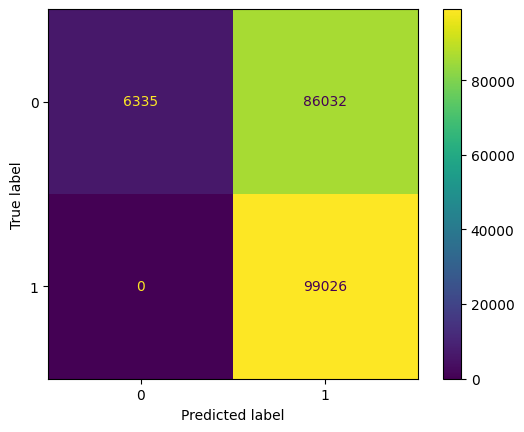

In [127]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot();

Dari data tersebut terlihat bahwa, <br>
TN (True Negative) = 6335<br>
TP (True Positive) = 99026<br>
FN (False Negative) = 0<br>
FP (False Positive) = 86032<br>

## Optimisasi Naive Bayes

In [134]:
gnb_grid = GaussianNB()

param_grid = {
    'priors': [None, [0.2, 0.8], [0.5, 0.5], [0.8, 0.2]],
    'var_smoothing': np.logspace(0,-9, num=5)
}

grid_search = GridSearchCV(gnb_grid, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Score (Accuracy):", grid_search.best_score_)

Best Parameters: {'priors': [0.8, 0.2], 'var_smoothing': 0.005623413251903491}
Best Score (Accuracy): 0.5518660591715157


In [131]:
best_gnb = GaussianNB(priors=[0.8, 0.2], var_smoothing=0.005623413251903491)
best_gnb.fit(X_train, y_train)

GaussianNB(priors=[0.8, 0.2], var_smoothing=0.005623413251903491)

In [132]:
y_pred = best_gnb.predict(X_test)
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.5510494114204804
F1 Score: 0.677393978450134


### Kesimpulan

Dapat dilihat bahwa akurasi maksimum yang bisa didapatkan hanya sekitar 55.1%. Dengan demikian, bisa dibilang dataset ini kurang baik jika diaplikasikan menggunakan model Gauss. Terdapat beberapa faktor yang dapat mempengaruhi hal ini, seperti model dataset tersebut kurang mengikuti distribusi Gauss dan dataset cenderung kurang terdistribusi secara normal.

Untuk mencoba melakukan performa, kami menggunakan GridSearchCV yang melakukan cross validation dengn fold = K. Dengan memasukan parameter, priors dan var_smoothing. Dengan demikian, model tersebut dapat terjadi peningkatan performa walaupun sangat kecil.

# Support Vector Machine
Support Vector Machine (SVM) adalah salah satu algoritma machine learning dengan pendekatan supervised learning yang paling populer dan sering digunakan. SVM dapat digunakan dengan mencari hyperplane atau fungsi pemisah terbaik untuk memisahkan kelas. Algoritma SVM bekerja dengan mengelompokkan data-data dengan memisahkannya berdasarkan hyperplane dalam ruang N-dimensi (N – jumlah fitur) yang secara jelas mengklasifikasikan titik data. SVM sangat disukai karena algoritma ini dapat menghasilkan akurasi yang signifikan dengan daya komputasi yang lebih sedikit. Beberapa kelebihan dari SVM antara lain: mampu menangani data berdimensi tinggi, dapat digunakan untuk model pembelajaran semi-supervised, dan memiliki tingkat akurasi yang lebih baik dan melakukan prediksi lebih cepat. Namun, SVM memiliki kompleksitas komputasi yang lebih baik dibandingkan dengan algoritma lain.

In [19]:
# import library
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report

In [39]:
df_svm = df.copy()
df_svm.dropna(inplace=True)

In [40]:
df_svm.head()

,timestamp,hour,day,month,datetime,timezone,cab_type,price,distance,surge_multiplier,...,windSpeed,windGust,windGustTime,visibility,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMax,apparentTemperatureMin,apparentTemperatureMax
0,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Lyft,5.0,0.44,1.0,...,8.66,9.17,1.545016e+09,10.000,0.1276,1.544980e+09,39.89,43.68,33.73,38.07
1,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Lyft,11.0,0.44,1.0,...,11.98,11.98,1.543291e+09,4.786,0.1300,1.543252e+09,40.49,47.30,36.20,43.92
2,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Lyft,7.0,0.44,1.0,...,7.33,7.33,1.543334e+09,10.000,0.1064,1.543338e+09,35.36,47.55,31.04,44.12
3,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Lyft,26.0,0.44,1.0,...,5.28,5.28,1.543514e+09,10.000,0.0000,1.543507e+09,34.67,45.03,30.30,38.53
4,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Lyft,9.0,0.44,1.0,...,9.14,9.14,1.543446e+09,10.000,0.0001,1.543421e+09,33.10,42.18,29.11,35.75


In [41]:
df_svm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21834 entries, 0 to 23708
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   timestamp               21834 non-null  float64       
 1   hour                    21834 non-null  int64         
 2   day                     21834 non-null  int64         
 3   month                   21834 non-null  int64         
 4   datetime                21834 non-null  datetime64[ns]
 5   timezone                21834 non-null  object        
 6   cab_type                21834 non-null  object        
 7   price                   21834 non-null  float64       
 8   distance                21834 non-null  float64       
 9   surge_multiplier        21834 non-null  float64       
 10  temperature             21834 non-null  float64       
 11  precipIntensity         21834 non-null  float64       
 12  precipProbability       21834 non-null  float6

In [42]:
df_svm.columns

Index(['timestamp', 'hour', 'day', 'month', 'datetime', 'timezone', 'cab_type',
       'price', 'distance', 'surge_multiplier', 'temperature',
       'precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'windGustTime', 'visibility', 'precipIntensityMax',
       'uvIndexTime', 'temperatureMin', 'temperatureMax',
       'apparentTemperatureMin', 'apparentTemperatureMax'],
      dtype='object')

### Pemilihan Features

In [43]:
features = df_svm[['price', 'distance', 'surge_multiplier', 'temperature',
       'precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'windGustTime', 'visibility', 'precipIntensityMax',
       'uvIndexTime', 'temperatureMin', 'temperatureMax',
       'apparentTemperatureMin', 'apparentTemperatureMax']]
X = features
y = df_svm['cab_type']

Penentuan fitur-fitur yang akan digunakan untuk mendapatkan target cab_type. Fitur-fitur tersebut sangat mempengaruhi penumpang untuk memilih jenis taksi. Menjadikan cab_type sebagai target. Pemilihan 'cab_type' sebagai target adalah karena tujuan analisis adalah untuk memprediksi jenis taksi yang akan dipilih oleh pengguna berdasarkan kombinasi faktor-faktor di atas.

### Pembuatan Model SVM

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Membagi dataset menjadi dua bagian, yaitu data pelatihan(train) dan data pengujian(test)

In [45]:
# Pelatihan Model
cs = SVC(kernel='linear', random_state=0)
cs.fit(X_train, y_train)

SVC(kernel='linear', random_state=0)

In [46]:
y_pred = cs.predict(X_test)

In [47]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[ 817 1326]
 [ 823 1401]]


Membuat confussion matrix dari hasil prediksi model

In [48]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

        Lyft       0.50      0.38      0.43      2143
        Uber       0.51      0.63      0.57      2224

    accuracy                           0.51      4367
   macro avg       0.51      0.51      0.50      4367
weighted avg       0.51      0.51      0.50      4367



Cetak classification report

In [49]:
y_pred = cs.predict(X_test)

In [50]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Cetak classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[ 817 1326]
 [ 823 1401]]
Classification Report:
              precision    recall  f1-score   support

        Lyft       0.50      0.38      0.43      2143
        Uber       0.51      0.63      0.57      2224

    accuracy                           0.51      4367
   macro avg       0.51      0.51      0.50      4367
weighted avg       0.51      0.51      0.50      4367



Melakukan evaluasi hasil prediksi dari model

### Menampilkan Visualisasi Confussion Matrix


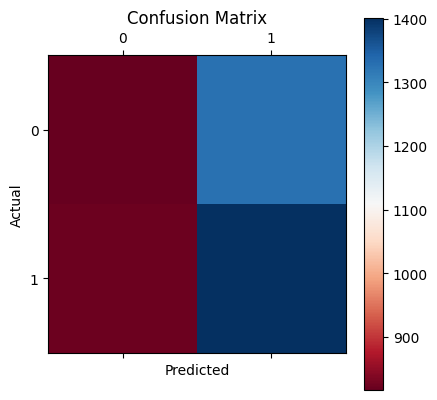

In [51]:
plt.matshow(cm, cmap='RdBu')
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### Kesimpulan

Berdasarkan hasil dari confusion matrix dan laporan klasifikasi di atas, kesimpulan yang dapat diambil adalah model memiliki tingkat akurasi sekitar 51%, yang menunjukkan performa klasifikasi yang kurang memuaskan. Precision dan recall untuk kedua kelas, "Lyft" dan "Uber," juga relatif rendah, dengan "Lyft" memiliki tingkat precision yang lebih rendah daripada "Uber," dan "Uber" memiliki recall yang lebih rendah daripada "Lyft."